In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import re
import math
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()
import numpy as np
run_id = "timps_test" 
server = f'/run/user/1000/gvfs/smb-share:server=132.66.152.167,share=ebenstein%202022'
run_id_path = f'{server}/5hmC_ONT_project_data_and_analysis/timp_data/analysis/18.07.23/' #/{run_id}/analysis30.05.23/
plot_path = run_id_path + 'events & NNN plots'
if not os.path.exists(plot_path):
    os.mkdir(run_id_path)
    os.mkdir(plot_path)
print(f"Directory {plot_path} created")
backwindow=18
frontwindow=10
full_dict = {"09": {"i": 0, "color": 'b', "name": "Cytosine", "Modification": "C"},
         "10": {"i": 1, "color": 'orange', "name": "5hmC", "Modification": "hmC"},
         "11": {"i": 2, "color": 'g', "name": "5gmc", "Modification": "Glu-hmC"},
         "12": {"i": 3, "color": 'r', "name": "5gmc-N3", "Modification": "N3-Glu-hmC"},
         "13": {"i": 4, "color": 'y', "name": "5mc", "Modification": "5mC"},
         "02": {"i": 1, "color": 'orange', "name": "hmC", "Modification": "hmC"},
         "03": {"i": 2, "color": 'g', "name": "5gmc", "Modification": "Glu-hmC"},
         "04": {"i": 3, "color": 'r', "name": "5gmc-N3", "Modification": "N3-Glu-hmC"}}
barcodes = ['02','03','04']
barcode_dict = {key: full_dict[key] for key in full_dict if key in barcodes}

back=7
front=3
total_pos = back+front+1
basecaller_outputs_dir='/home/nano/Documents/nanopore_piplines/timps_data/test_pipline/'
locs = pd.read_csv(f'{basecaller_outputs_dir}barcode03/modified_sites.bedgraph', 
                   header=None, sep="\t")
locs.columns = ['NC','c','g','seq']
locs['loc_files'] = (locs['c']-backwindow).map(str)+"_"+(locs['c']+frontwindow).map(str)
modifications = locs['c'].to_numpy()
loc_files = list(locs['loc_files'].to_numpy())
loc_files = loc_files
import matplotlib
print(f'matplotlib {matplotlib. __version__}')
print(f'seaborn {sns. __version__}')
print(loc_files)

Directory /run/user/1000/gvfs/smb-share:server=132.66.152.167,share=ebenstein%202022/5hmC_ONT_project_data_and_analysis/timp_data/analysis/18.07.23/events & NNN plots created
matplotlib 3.7.1
seaborn 0.12.2
['110037796_110037824', '20467907_20467935', '31229397_31229425', '42454788_42454816', '103777967_103777995', '107098592_107098620', '119988617_119988645', '121485966_121485994', '132490507_132490535', '134110298_134110326', '3649964_3649992', '50073820_50073848', '153073842_153073870', '68038689_68038717', '185755038_185755066', '88165991_88166019', '192541980_192542008', '39939484_39939512', '50730663_50730691', '87327020_87327048', '87327066_87327094', '99979332_99979360', '19397145_19397173', '40938794_40938822', '44786251_44786279', '47244447_47244475', '69721612_69721640', '100044153_100044181', '59200789_59200817', '77838197_77838225', '96828105_96828133', '98255309_98255337', '99676075_99676103', '35229338_35229366', '43098937_43098965', '58430088_58430116', '72511933_725119

In [2]:
total_df = pd.DataFrame()
appended_data = []
bc_df={}
grouped={}
for seq_location in loc_files:
    start_loc = int(seq_location.split('_')[0])
    mod_loc = start_loc + backwindow 
    for bc in barcodes:#full_dict.keys():
        print(seq_location)
        try:
            bc_df[bc]=pd.read_csv(
                f'{basecaller_outputs_dir}barcode{bc}_epi_basecaller_outputs/eventalign_forward/{seq_location}.eventalign.tsv', 
                header=None, sep="\t")#.head(1000) # TO_REMOVE head!!!
            bc_df[bc] = bc_df[bc][(bc_df[bc][1] >= mod_loc - back) & (bc_df[bc][1] <= mod_loc + front)]
            bc_df[bc][["ones"]]=1
            bc_df[bc].to_pickle(f'{run_id_path}/bc_{bc}_{mod_loc}_mod_pos_eventalign.pkl')
        except:
            print(f'bad {seq_location} eventalign file on barcode {bc}')

#     grouped09=bc_df['09'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped10=bc_df['10'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped11=bc_df['11'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped12=bc_df['12'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#         grouped['13']=bc_df[bc].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#         grouped['13']= grouped['13'].reset_index()
# #     grouped09= grouped09.reset_index()
# #     grouped10= grouped10.reset_index()
# #     grouped11= grouped11.reset_index()
# #     grouped12= grouped12.reset_index()
#     mapped09=grouped09.groupby([1]).agg({8:'mean', "ones":'mean',6:'mean'})
#     for index, row in grouped09.iterrows():
#         grouped09.at[index,"current diff"]=(grouped09.loc[index,6])-(mapped09.loc[(grouped09.iloc[index,0]),6])
#         grouped09.at[index,"dwell diff"]=(grouped09.loc[index,8])-(mapped09.loc[(grouped09.iloc[index,0]),8])
#     for index, row in grouped10.iterrows():
#         grouped10.at[index,"current diff"]=(grouped10.loc[index,6])-(mapped09.loc[(grouped10.iloc[index,0]),6])
#         grouped10.at[index,"dwell diff"]=(grouped10.loc[index,8])-(mapped09.loc[(grouped10.iloc[index,0]),8])
#     for index, row in grouped11.iterrows():
#         grouped11.at[index,"current diff"]=(grouped11.loc[index,6])-(mapped09.loc[(grouped11.iloc[index,0]),6])
#         grouped11.at[index,"dwell diff"]=(grouped11.loc[index,8])-(mapped09.loc[(grouped11.iloc[index,0]),8])
#     for index, row in grouped12.iterrows():
#         grouped12.at[index,"current diff"]=(grouped12.loc[index,6])-(mapped09.loc[(grouped12.iloc[index,0]),6])
#         grouped12.at[index,"dwell diff"]=(grouped12.loc[index,8])-(mapped09.loc[(grouped12.iloc[index,0]),8])
#     grouped09["Modification"]="C"
#     grouped10["Modification"]="hmC"
#     grouped11["Modification"]="Glu-hmC"
#     grouped12["Modification"]="N3-Glu-hmC"
#     df = pd.concat([grouped09, grouped10, grouped11, grouped12])
#     df['seq_location'] = seq_location
#     appended_data.append(df)

# total_df = pd.concat(appended_data)
# total_df.to_pickle(f'{run_id_path}/pos_read_grouped_C_norm_current_dwell_df.pkl')
# total_df['seq_location'].unique()

110037796_110037824
110037796_110037824
110037796_110037824
20467907_20467935
20467907_20467935
20467907_20467935
31229397_31229425
31229397_31229425
31229397_31229425
42454788_42454816
42454788_42454816
42454788_42454816
103777967_103777995
103777967_103777995
103777967_103777995
107098592_107098620
107098592_107098620
107098592_107098620
119988617_119988645
119988617_119988645
119988617_119988645
121485966_121485994
121485966_121485994
121485966_121485994
132490507_132490535
132490507_132490535
132490507_132490535
134110298_134110326
134110298_134110326
134110298_134110326
3649964_3649992
3649964_3649992
3649964_3649992
50073820_50073848
50073820_50073848
50073820_50073848
153073842_153073870
153073842_153073870
153073842_153073870
68038689_68038717
68038689_68038717
68038689_68038717
185755038_185755066
185755038_185755066
185755038_185755066
88165991_88166019
88165991_88166019
88165991_88166019
192541980_192542008
192541980_192542008
192541980_192542008
39939484_39939512
39939484_3

In [544]:
loc_files
total_pos = back+front+1

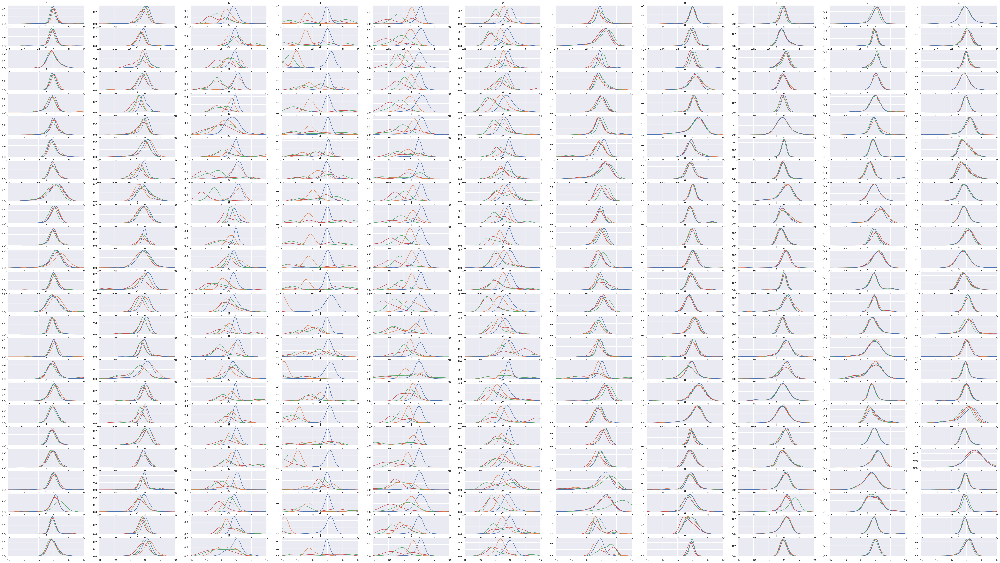

In [28]:
total_df = pd.read_pickle(f'{run_id_path}/pos_read_grouped_C_norm_current_dwell_df.pkl')
fig, axes = plt.subplots(len(loc_files), total_pos, figsize=(71.2,40))
j=0
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    i=0
    for key in positions:
         pos=i-back
         ax=sns.kdeplot(data=df.loc[df[1]==key], x='current diff',hue="Modification", ax=axes[j,i], legend=False, common_norm=False)
         ax.set(xlabel=None)
         ax.set_title(pos)
         ax.set(ylabel=None)
         ax.set_xlim(-15,10)
         i+=1
    j+=1
plt.plot()
plt.savefig(f'{run_id_path}/events & NNN plots/1total_curr_diff_all_pos.png')

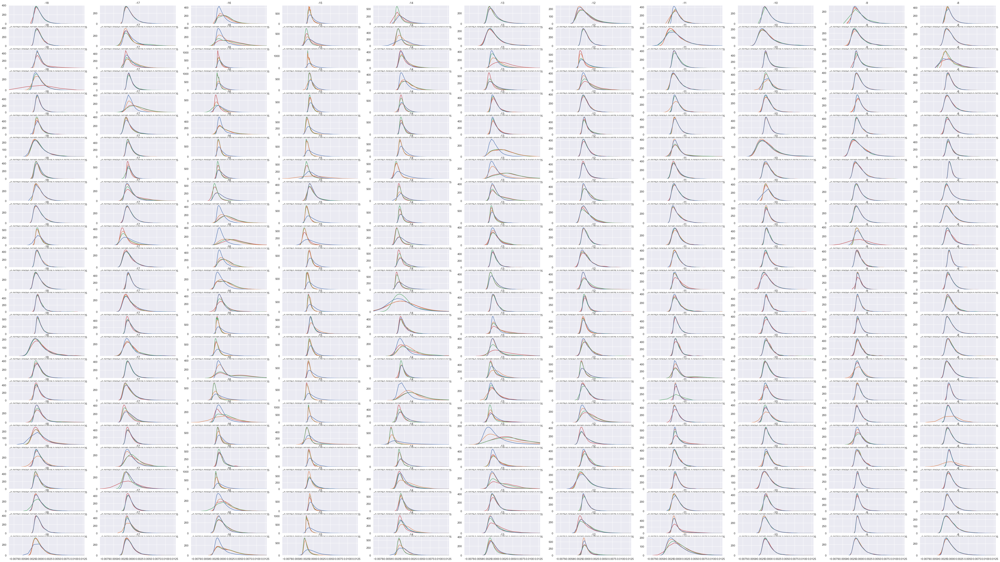

In [546]:
fig, axes = plt.subplots(len(loc_files), total_pos, figsize=(71.2,40))
j=0
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    i=0
    for key in positions:
        pos=i-back
        ax=sns.kdeplot(data=df.loc[df[1]==key], x='dwell diff',hue="Modification", ax=axes[j,i], legend=False, common_norm=False)
        ax.set(xlabel=None)
        ax.set_title(pos)
        ax.set(ylabel=None)
        ax.set_xlim(-0.009,0.013)
        i+=1
    j+=1
plt.plot()
plt.savefig(f'{run_id_path}/events & NNN plots/1total_dwell diff_all_pos2.png')

In [42]:
# https://stackoverflow.com/questions/35042255/how-to-plot-multiple-seaborn-jointplot-in-subplot

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np


class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if (isinstance(self.sg, sns.axisgrid.FacetGrid) or isinstance(self.sg, sns.axisgrid.PairGrid)):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(
            n, m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i, j], self.subgrid[i, j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h = self.sg.ax_joint.get_position().height
        h2 = self.sg.ax_marg_x.get_position().height
        r = int(np.round(h / h2))
        self._resize()
        self.subgrid = (gridspec.GridSpecFromSubplotSpec(r + 1, r + 1,
                        subplot_spec=self.subplot))

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        # https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure = self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [4]:
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    fig = plt.figure(figsize=(32,6))
    gs = gridspec.GridSpec(1, 8)
    i=0
    for key in positions[back-7:back+1]:
        plot = sns.jointplot(data=df.loc[df[1]==key], x='current diff', y='dwell diff', hue="Modification", alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
        plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
        plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
        plot.ax_joint.set_xlabel(f'{i-7}', fontweight='bold', fontsize=13)
        plot.ax_joint.set_ylabel(None)
        plot.ax_joint.set_xlim(-15,10)
        plot.ax_joint.set_ylim(-0.005,0.02)
        #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
       # plot.tick_params(axis='both', which='major', labelsize=8)
        mgkey = SeabornFig2Grid(plot, fig, gs[i])
        i+=1
    #gs = gs.annotate(stats.pearsonr, fontsize=10)
    fig.text(0.5, 0.02, 'current diff', ha='center', va='center', fontweight='bold', fontsize=20)
    fig.text(0.04, 0.5, 'dwell diff', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=20)
    gs.tight_layout(fig)
    plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_by_pos.png')

NameError: name 'total_df' is not defined

In [15]:
print(loc_files)
i=0
fig = plt.figure(figsize=(71.2,40))
gs = gridspec.GridSpec(5, 5)
hole_window_agg = {}

for seq_location in loc_files:
    mod_loc = int(seq_location.split('_')[0])+backwindow
    hole_window_agg[seq_location] = {}

    bc_df = {}
    for bc in barcodes:#full_dict.keys():
        bc_df[bc] = pd.read_pickle(f'{run_id_path}/bc_{bc}_{mod_loc}_mod_pos_eventalign.pkl')
    
    for bc in barcodes:# full_dict.keys():
    ### Jonathans window agg suggestion! -8 to +3 known pos to known pos
        hole_window_agg[seq_location][bc] = bc_df[bc].groupby([3]).agg({6: 'mean', 8: 'sum', 13: lambda x: ','.join(x)})
        hole_window_agg[seq_location][bc][13] = [list(map(float, i)) for i in hole_window_agg[seq_location][bc][13].str.split(",")]

        # drow functions the vectors on scatter!!!!
        hole_window_agg[seq_location][bc]['samples_count'] = hole_window_agg[seq_location][bc][13].str.len()

        # hole_window_agg[seq_location][bc][13] = hole_window_agg[seq_location][bc][13].str.split(",")
        # drow the vectors on scatter!!!!
        # hole_window_agg[seq_location][bc]['samples_count'] = hole_window_agg[seq_location][bc][13].str.len()
        # g = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index().loc[lambda count : count>12].plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
        # mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
        # median = hole_window_agg[seq_location][bc]['samples_count'].median()
        # fig2 = g.figure
        # plt.axvline(mean, color='r', linestyle='--')
        # plt.axvline(median, color='g', linestyle='--')
        # plt.xticks(rotation = 90)
        # fig2.suptitle(bc, fontweight='bold', fontsize=13)
        # plt.show()
        # fig2.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')
#         hole_window_agg09 = hole_window_agg[seq_location][min(full_dict.keys())].groupby(lambda _: True)\
#             .agg({6: 'mean', 8: 'mean'})
#         hole_window_agg[seq_location][bc]['curr diff'] = hole_window_agg[seq_location][bc][6]-hole_window_agg09[6][1]
#         hole_window_agg[seq_location][bc]['d_time diff'] = hole_window_agg[seq_location][bc][8]-hole_window_agg09[8][1]
        hole_window_agg[seq_location][bc]["Modification"]=full_dict[bc]["Modification"]
        hole_window_agg[seq_location][bc].to_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')

#     df = pd.concat([hole_window_agg[seq_location][bc] for bc in full_dict.keys()])
#     # fig = plt.figure(figsize=(4,6))
#     plot = sns.jointplot(data=df, x='curr diff', y='d_time diff', hue='Modification', alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
#     plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
#     plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
#     plot.ax_joint.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
#     plot.ax_joint.set_ylabel(None)
#     plot.ax_joint.set_xlim(-15,20)
#     plot.ax_joint.set_ylim(-0.04,0.05)
#     #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
#     mgkey = SeabornFig2Grid(plot, fig, gs[i])
#     i+=1
#     #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
#     #plot.tick_params(axis='both', which='major', labelsize=8)
# gs.tight_layout(fig)
# fig.text(0.5, 0.00, 'current diff', ha='center', va='center', fontweight='bold', fontsize=40)
# fig.text(0.02, 0.5, 'dwell time diff', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=40)
# # plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_curr_dwel_C_norm_by_kmer.png')


['110037796_110037824', '20467907_20467935', '31229397_31229425', '42454788_42454816', '103777967_103777995', '107098592_107098620', '119988617_119988645', '121485966_121485994', '132490507_132490535', '134110298_134110326', '3649964_3649992', '50073820_50073848', '153073842_153073870', '68038689_68038717', '185755038_185755066', '88165991_88166019', '192541980_192542008', '39939484_39939512', '50730663_50730691', '87327020_87327048', '87327066_87327094', '99979332_99979360', '19397145_19397173', '40938794_40938822', '44786251_44786279', '47244447_47244475', '69721612_69721640', '100044153_100044181', '59200789_59200817', '77838197_77838225', '96828105_96828133', '98255309_98255337', '99676075_99676103', '35229338_35229366', '43098937_43098965', '58430088_58430116', '72511933_72511961', '76354302_76354330', '78457761_78457789', '29045773_29045801', '30878047_30878075', '35546085_35546113', '45885737_45885765', '46269849_46269877', '84162482_84162510', '35274333_35274361', '54892999_548

17     a7f74d05-8681-4f7a-b905-4bb8bc067a78
18     a7f74d05-8681-4f7a-b905-4bb8bc067a78
19     a7f74d05-8681-4f7a-b905-4bb8bc067a78
20     a7f74d05-8681-4f7a-b905-4bb8bc067a78
21     a7f74d05-8681-4f7a-b905-4bb8bc067a78
                       ...                 
353    836b19f4-30e3-4032-91fc-835e08bc6ca5
354    836b19f4-30e3-4032-91fc-835e08bc6ca5
355    836b19f4-30e3-4032-91fc-835e08bc6ca5
356    836b19f4-30e3-4032-91fc-835e08bc6ca5
357    836b19f4-30e3-4032-91fc-835e08bc6ca5
Name: 3, Length: 153, dtype: object
27     3d10d2a2-adf5-46cf-8c5a-63dc91ef0257
28     3d10d2a2-adf5-46cf-8c5a-63dc91ef0257
29     3d10d2a2-adf5-46cf-8c5a-63dc91ef0257
30     3d10d2a2-adf5-46cf-8c5a-63dc91ef0257
31     3d10d2a2-adf5-46cf-8c5a-63dc91ef0257
                       ...                 
278    d29eabba-f879-4cf3-b194-0efd26651601
279    d29eabba-f879-4cf3-b194-0efd26651601
280    d29eabba-f879-4cf3-b194-0efd26651601
281    d29eabba-f879-4cf3-b194-0efd26651601
282    d29eabba-f879-4cf3-b194-0efd26651

16     98c6f23f-c065-4bdc-a27c-278cb9b26e72
17     98c6f23f-c065-4bdc-a27c-278cb9b26e72
18     98c6f23f-c065-4bdc-a27c-278cb9b26e72
19     98c6f23f-c065-4bdc-a27c-278cb9b26e72
20     98c6f23f-c065-4bdc-a27c-278cb9b26e72
                       ...                 
691    592bfc7c-d285-4365-b162-0f76e3135ba9
692    592bfc7c-d285-4365-b162-0f76e3135ba9
693    592bfc7c-d285-4365-b162-0f76e3135ba9
694    592bfc7c-d285-4365-b162-0f76e3135ba9
695    592bfc7c-d285-4365-b162-0f76e3135ba9
Name: 3, Length: 291, dtype: object
27     78a264b2-5876-420b-8528-c55437d23d46
28     78a264b2-5876-420b-8528-c55437d23d46
29     78a264b2-5876-420b-8528-c55437d23d46
30     78a264b2-5876-420b-8528-c55437d23d46
31     78a264b2-5876-420b-8528-c55437d23d46
                       ...                 
497    aeb0b3aa-a3a3-43c5-bec6-bf035f5f805f
498    aeb0b3aa-a3a3-43c5-bec6-bf035f5f805f
499    aeb0b3aa-a3a3-43c5-bec6-bf035f5f805f
500    aeb0b3aa-a3a3-43c5-bec6-bf035f5f805f
501    aeb0b3aa-a3a3-43c5-bec6-bf035f5f8

23      b60f4eaf-44d7-494e-82d0-39bb1997512c
24      b60f4eaf-44d7-494e-82d0-39bb1997512c
25      b60f4eaf-44d7-494e-82d0-39bb1997512c
26      b60f4eaf-44d7-494e-82d0-39bb1997512c
27      b60f4eaf-44d7-494e-82d0-39bb1997512c
                        ...                 
1323    8ff72a02-aa97-4f23-b1b9-e922169747e4
1324    8ff72a02-aa97-4f23-b1b9-e922169747e4
1325    8ff72a02-aa97-4f23-b1b9-e922169747e4
1326    8ff72a02-aa97-4f23-b1b9-e922169747e4
1327    8ff72a02-aa97-4f23-b1b9-e922169747e4
Name: 3, Length: 924, dtype: object
24     f52fc390-0bf3-4ce9-ba69-f571344c2486
25     f52fc390-0bf3-4ce9-ba69-f571344c2486
26     f52fc390-0bf3-4ce9-ba69-f571344c2486
27     f52fc390-0bf3-4ce9-ba69-f571344c2486
28     f52fc390-0bf3-4ce9-ba69-f571344c2486
                       ...                 
655    3ed6cabc-c010-4281-8bc5-b3727eeb28f8
656    3ed6cabc-c010-4281-8bc5-b3727eeb28f8
657    3ed6cabc-c010-4281-8bc5-b3727eeb28f8
658    3ed6cabc-c010-4281-8bc5-b3727eeb28f8
659    3ed6cabc-c010-4281-8bc

17     05ead54e-5383-452f-b42b-4207d0760a14
18     05ead54e-5383-452f-b42b-4207d0760a14
19     05ead54e-5383-452f-b42b-4207d0760a14
20     05ead54e-5383-452f-b42b-4207d0760a14
21     05ead54e-5383-452f-b42b-4207d0760a14
                       ...                 
449    c73d7195-9eab-488f-be66-ca0118e65397
450    c73d7195-9eab-488f-be66-ca0118e65397
451    c73d7195-9eab-488f-be66-ca0118e65397
452    c73d7195-9eab-488f-be66-ca0118e65397
453    c73d7195-9eab-488f-be66-ca0118e65397
Name: 3, Length: 159, dtype: object
25     b9cb76e8-ae7e-4d1e-814b-e90333522591
26     b9cb76e8-ae7e-4d1e-814b-e90333522591
27     b9cb76e8-ae7e-4d1e-814b-e90333522591
28     b9cb76e8-ae7e-4d1e-814b-e90333522591
29     b9cb76e8-ae7e-4d1e-814b-e90333522591
30     b9cb76e8-ae7e-4d1e-814b-e90333522591
31     b9cb76e8-ae7e-4d1e-814b-e90333522591
32     b9cb76e8-ae7e-4d1e-814b-e90333522591
33     b9cb76e8-ae7e-4d1e-814b-e90333522591
34     b9cb76e8-ae7e-4d1e-814b-e90333522591
35     b9cb76e8-ae7e-4d1e-814b-e90333522

27     386a896a-9aa1-434b-99bd-7893fd5bdabc
28     386a896a-9aa1-434b-99bd-7893fd5bdabc
29     386a896a-9aa1-434b-99bd-7893fd5bdabc
30     386a896a-9aa1-434b-99bd-7893fd5bdabc
31     386a896a-9aa1-434b-99bd-7893fd5bdabc
                       ...                 
343    b5ed6d24-a51a-4d60-9e31-b7c0d744fc17
344    b5ed6d24-a51a-4d60-9e31-b7c0d744fc17
345    b5ed6d24-a51a-4d60-9e31-b7c0d744fc17
346    b5ed6d24-a51a-4d60-9e31-b7c0d744fc17
347    b5ed6d24-a51a-4d60-9e31-b7c0d744fc17
Name: 3, Length: 130, dtype: object
22     ed6372ed-e746-4c4b-9a87-6ad67d82a74a
23     ed6372ed-e746-4c4b-9a87-6ad67d82a74a
24     ed6372ed-e746-4c4b-9a87-6ad67d82a74a
25     ed6372ed-e746-4c4b-9a87-6ad67d82a74a
26     ed6372ed-e746-4c4b-9a87-6ad67d82a74a
                       ...                 
518    a1dab883-6cf2-4e25-8e00-c85f9fd81000
519    a1dab883-6cf2-4e25-8e00-c85f9fd81000
520    a1dab883-6cf2-4e25-8e00-c85f9fd81000
521    a1dab883-6cf2-4e25-8e00-c85f9fd81000
554    8565598f-758a-428b-805a-2ea2fefc8

93     bdc67104-d0e6-4c6f-bb00-7b30140a04fb
94     bdc67104-d0e6-4c6f-bb00-7b30140a04fb
95     bdc67104-d0e6-4c6f-bb00-7b30140a04fb
96     bdc67104-d0e6-4c6f-bb00-7b30140a04fb
97     bdc67104-d0e6-4c6f-bb00-7b30140a04fb
                       ...                 
524    20eda483-1856-495f-9129-4dcb636fe295
525    20eda483-1856-495f-9129-4dcb636fe295
526    20eda483-1856-495f-9129-4dcb636fe295
527    20eda483-1856-495f-9129-4dcb636fe295
528    20eda483-1856-495f-9129-4dcb636fe295
Name: 3, Length: 189, dtype: object
77     dde34391-428f-4ea9-a0e2-2542b50c41f9
78     dde34391-428f-4ea9-a0e2-2542b50c41f9
79     dde34391-428f-4ea9-a0e2-2542b50c41f9
80     dde34391-428f-4ea9-a0e2-2542b50c41f9
81     dde34391-428f-4ea9-a0e2-2542b50c41f9
                       ...                 
881    cfd0a145-2c4b-40b1-aa70-a2d5c3563fed
882    cfd0a145-2c4b-40b1-aa70-a2d5c3563fed
883    cfd0a145-2c4b-40b1-aa70-a2d5c3563fed
884    cfd0a145-2c4b-40b1-aa70-a2d5c3563fed
885    cfd0a145-2c4b-40b1-aa70-a2d5c3563

20     ac755c7c-684b-432c-bf66-2e022290a7f4
21     ac755c7c-684b-432c-bf66-2e022290a7f4
22     ac755c7c-684b-432c-bf66-2e022290a7f4
23     ac755c7c-684b-432c-bf66-2e022290a7f4
24     ac755c7c-684b-432c-bf66-2e022290a7f4
                       ...                 
301    f4b9ea96-2d6b-4c53-a5e5-65cebed13dc0
302    f4b9ea96-2d6b-4c53-a5e5-65cebed13dc0
303    f4b9ea96-2d6b-4c53-a5e5-65cebed13dc0
304    f4b9ea96-2d6b-4c53-a5e5-65cebed13dc0
305    f4b9ea96-2d6b-4c53-a5e5-65cebed13dc0
Name: 3, Length: 116, dtype: object
25     4f1f317b-81f0-412f-b8a4-be4887e88bc9
26     4f1f317b-81f0-412f-b8a4-be4887e88bc9
27     4f1f317b-81f0-412f-b8a4-be4887e88bc9
28     4f1f317b-81f0-412f-b8a4-be4887e88bc9
29     4f1f317b-81f0-412f-b8a4-be4887e88bc9
                       ...                 
674    9afe7fc4-33cc-4ef4-845f-7d3d70b29a92
675    9afe7fc4-33cc-4ef4-845f-7d3d70b29a92
676    9afe7fc4-33cc-4ef4-845f-7d3d70b29a92
677    9afe7fc4-33cc-4ef4-845f-7d3d70b29a92
678    9afe7fc4-33cc-4ef4-845f-7d3d70b29

33      e29f345d-0c3c-407a-a34f-f92609b79ed8
34      e29f345d-0c3c-407a-a34f-f92609b79ed8
35      e29f345d-0c3c-407a-a34f-f92609b79ed8
36      e29f345d-0c3c-407a-a34f-f92609b79ed8
37      e29f345d-0c3c-407a-a34f-f92609b79ed8
                        ...                 
1280    ccc08be1-e08c-4b2b-80b8-4b349cd86814
1281    ccc08be1-e08c-4b2b-80b8-4b349cd86814
1282    ccc08be1-e08c-4b2b-80b8-4b349cd86814
1283    ccc08be1-e08c-4b2b-80b8-4b349cd86814
1284    ccc08be1-e08c-4b2b-80b8-4b349cd86814
Name: 3, Length: 394, dtype: object
10     641fe473-f5e6-483f-add3-2f6643daba1d
11     641fe473-f5e6-483f-add3-2f6643daba1d
12     641fe473-f5e6-483f-add3-2f6643daba1d
13     641fe473-f5e6-483f-add3-2f6643daba1d
14     641fe473-f5e6-483f-add3-2f6643daba1d
                       ...                 
344    b440bbd2-25fb-4739-a7ef-9fac7db96b2c
345    b440bbd2-25fb-4739-a7ef-9fac7db96b2c
346    b440bbd2-25fb-4739-a7ef-9fac7db96b2c
347    b440bbd2-25fb-4739-a7ef-9fac7db96b2c
348    b440bbd2-25fb-4739-a7e

19     69df8594-176a-46d3-948a-ef0ca539ade5
20     69df8594-176a-46d3-948a-ef0ca539ade5
21     69df8594-176a-46d3-948a-ef0ca539ade5
22     69df8594-176a-46d3-948a-ef0ca539ade5
23     69df8594-176a-46d3-948a-ef0ca539ade5
                       ...                 
542    fb14fbc6-1aac-4bb8-8e66-c2bf18693af9
543    fb14fbc6-1aac-4bb8-8e66-c2bf18693af9
544    fb14fbc6-1aac-4bb8-8e66-c2bf18693af9
545    fb14fbc6-1aac-4bb8-8e66-c2bf18693af9
546    fb14fbc6-1aac-4bb8-8e66-c2bf18693af9
Name: 3, Length: 223, dtype: object
0      6c622ae0-110b-4dda-8e21-b9d364d4c55d
36     da1d99e8-0d8e-437c-84c3-2218be5f6104
37     da1d99e8-0d8e-437c-84c3-2218be5f6104
38     da1d99e8-0d8e-437c-84c3-2218be5f6104
39     da1d99e8-0d8e-437c-84c3-2218be5f6104
                       ...                 
380    5dc5b20b-0eff-4ef9-8a75-e6a0dc541665
381    5dc5b20b-0eff-4ef9-8a75-e6a0dc541665
382    5dc5b20b-0eff-4ef9-8a75-e6a0dc541665
383    5dc5b20b-0eff-4ef9-8a75-e6a0dc541665
384    5dc5b20b-0eff-4ef9-8a75-e6a0dc541

12      c73d0a93-0f6d-4e12-bec7-357e904b703c
13      c73d0a93-0f6d-4e12-bec7-357e904b703c
14      c73d0a93-0f6d-4e12-bec7-357e904b703c
15      c73d0a93-0f6d-4e12-bec7-357e904b703c
16      c73d0a93-0f6d-4e12-bec7-357e904b703c
                        ...                 
1969    6a34355f-e8ee-4cfb-a81d-6c3bc6d51d47
1970    6a34355f-e8ee-4cfb-a81d-6c3bc6d51d47
1971    6a34355f-e8ee-4cfb-a81d-6c3bc6d51d47
1972    6a34355f-e8ee-4cfb-a81d-6c3bc6d51d47
1973    6a34355f-e8ee-4cfb-a81d-6c3bc6d51d47
Name: 3, Length: 1645, dtype: object
30     a87bfba2-8708-4f9e-8c99-9362f66bdc99
31     a87bfba2-8708-4f9e-8c99-9362f66bdc99
32     a87bfba2-8708-4f9e-8c99-9362f66bdc99
33     a87bfba2-8708-4f9e-8c99-9362f66bdc99
34     a87bfba2-8708-4f9e-8c99-9362f66bdc99
                       ...                 
430    32ab0b3c-0f1c-475e-83ba-03f15de8a72b
431    32ab0b3c-0f1c-475e-83ba-03f15de8a72b
432    32ab0b3c-0f1c-475e-83ba-03f15de8a72b
433    32ab0b3c-0f1c-475e-83ba-03f15de8a72b
434    32ab0b3c-0f1c-475e-83

4      cc988d1a-b853-41b5-a6a8-92db488fcae0
5      cc988d1a-b853-41b5-a6a8-92db488fcae0
6      cc988d1a-b853-41b5-a6a8-92db488fcae0
7      cc988d1a-b853-41b5-a6a8-92db488fcae0
8      cc988d1a-b853-41b5-a6a8-92db488fcae0
                       ...                 
245    873d2565-2c25-451d-b5f8-284010c60ee4
246    873d2565-2c25-451d-b5f8-284010c60ee4
247    873d2565-2c25-451d-b5f8-284010c60ee4
248    873d2565-2c25-451d-b5f8-284010c60ee4
249    873d2565-2c25-451d-b5f8-284010c60ee4
Name: 3, Length: 100, dtype: object
42     5cdf5053-223c-41c8-80d0-40c46638ed34
43     5cdf5053-223c-41c8-80d0-40c46638ed34
44     5cdf5053-223c-41c8-80d0-40c46638ed34
45     5cdf5053-223c-41c8-80d0-40c46638ed34
46     5cdf5053-223c-41c8-80d0-40c46638ed34
                       ...                 
769    f685b59c-34da-4616-ab06-053c72ccdb2b
770    f685b59c-34da-4616-ab06-053c72ccdb2b
771    f685b59c-34da-4616-ab06-053c72ccdb2b
772    f685b59c-34da-4616-ab06-053c72ccdb2b
773    f685b59c-34da-4616-ab06-053c72ccd

22     770da793-c3db-4360-88d3-a7d39cb59d69
23     770da793-c3db-4360-88d3-a7d39cb59d69
24     770da793-c3db-4360-88d3-a7d39cb59d69
25     770da793-c3db-4360-88d3-a7d39cb59d69
26     770da793-c3db-4360-88d3-a7d39cb59d69
                       ...                 
357    e0ad2acc-afd2-4b35-b328-53e41a7417f8
358    e0ad2acc-afd2-4b35-b328-53e41a7417f8
359    e0ad2acc-afd2-4b35-b328-53e41a7417f8
360    e0ad2acc-afd2-4b35-b328-53e41a7417f8
361    e0ad2acc-afd2-4b35-b328-53e41a7417f8
Name: 3, Length: 168, dtype: object
17     6eacb436-6da5-4a81-b293-ff4221999d29
18     6eacb436-6da5-4a81-b293-ff4221999d29
19     6eacb436-6da5-4a81-b293-ff4221999d29
20     6eacb436-6da5-4a81-b293-ff4221999d29
21     6eacb436-6da5-4a81-b293-ff4221999d29
                       ...                 
169    144bd85a-a1bf-4a8b-adf4-5db9479c7ebc
170    144bd85a-a1bf-4a8b-adf4-5db9479c7ebc
171    144bd85a-a1bf-4a8b-adf4-5db9479c7ebc
172    144bd85a-a1bf-4a8b-adf4-5db9479c7ebc
173    144bd85a-a1bf-4a8b-adf4-5db9479c7

KeyboardInterrupt: 

<Figure size 7120x4000 with 0 Axes>

In [3]:
print(loc_files)
i=0
fig = plt.figure(figsize=(71.2,40))
gs = gridspec.GridSpec(5, 5)
for seq_location in loc_files:
    
    mod_loc = int(seq_location.split('_')[0])+1+backwindow

    ### Jonathans window agg suggestion! -8 to +3 known pos to known pos
        # g = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index().loc[lambda count : count>12].plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
        # mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
        # median = hole_window_agg[seq_location][bc]['samples_count'].median()
        # fig2 = g.figure
        # plt.axvline(mean, color='r', linestyle='--')
        # plt.axvline(median, color='g', linestyle='--')
        # plt.xticks(rotation = 90)
        # fig2.suptitle(bc, fontweight='bold', fontsize=13)
        # plt.show()
        # fig2.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')

    # df = pd.concat([hole_window_agg[seq_location][bc] for bc in full_dict.keys()])
    # fig = plt.figure(figsize=(4,6))
    plot = sns.jointplot(data=df, x='curr diff', y='samples_count', hue='Modification', alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
    plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
    plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
    plot.ax_joint.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
    plot.ax_joint.set_ylabel(None)
    plot.ax_joint.set_xlim(-15,20)
    plot.ax_joint.set_ylim(-5,250)
    #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
    mgkey = SeabornFig2Grid(plot, fig, gs[i])
    i+=1
    #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
    #plot.tick_params(axis='both', which='major', labelsize=8)
gs.tight_layout(fig)
fig.text(0.5, 0.00, 'current diff', ha='center', va='center', fontweight='bold', fontsize=40)
fig.text(0.02, 0.5, 'samples_count', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=40)
plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_normC_curr_sampels_count_by_kmer.png')

['110037796_110037824', '20467907_20467935', '31229397_31229425', '42454788_42454816', '103777967_103777995', '107098592_107098620', '119988617_119988645', '121485966_121485994', '132490507_132490535', '134110298_134110326', '3649964_3649992', '50073820_50073848', '153073842_153073870', '68038689_68038717', '185755038_185755066', '88165991_88166019', '192541980_192542008', '39939484_39939512', '50730663_50730691', '87327020_87327048', '87327066_87327094', '99979332_99979360', '19397145_19397173', '40938794_40938822', '44786251_44786279', '47244447_47244475', '69721612_69721640', '100044153_100044181', '59200789_59200817', '77838197_77838225', '96828105_96828133', '98255309_98255337', '99676075_99676103', '35229338_35229366', '43098937_43098965', '58430088_58430116', '72511933_72511961', '76354302_76354330', '78457761_78457789', '29045773_29045801', '30878047_30878075', '35546085_35546113', '45885737_45885765', '46269849_46269877', '84162482_84162510', '35274333_35274361', '54892999_548

NameError: name 'df' is not defined

<Figure size 7120x4000 with 0 Axes>

In [5]:

y

NameError: name 'y' is not defined

90 slice
agg_94738249_-7_to+3_#curr_samples_=_90_lineplot_by_kmer.png
90 done!
91 slice
agg_94738249_-7_to+3_#curr_samples_=_91_lineplot_by_kmer.png
91 done!
92 slice
agg_94738249_-7_to+3_#curr_samples_=_92_lineplot_by_kmer.png
92 done!
93 slice
agg_94738249_-7_to+3_#curr_samples_=_93_lineplot_by_kmer.png
93 done!
94 slice
agg_94738249_-7_to+3_#curr_samples_=_94_lineplot_by_kmer.png
94 done!
95 slice
agg_94738249_-7_to+3_#curr_samples_=_95_lineplot_by_kmer.png
95 done!
96 slice
agg_94738249_-7_to+3_#curr_samples_=_96_lineplot_by_kmer.png
96 done!
97 slice
agg_94738249_-7_to+3_#curr_samples_=_97_lineplot_by_kmer.png
97 done!
98 slice
agg_94738249_-7_to+3_#curr_samples_=_98_lineplot_by_kmer.png
98 done!
99 slice
agg_94738249_-7_to+3_#curr_samples_=_99_lineplot_by_kmer.png
99 done!
100 slice
agg_94738249_-7_to+3_#curr_samples_=_100_lineplot_by_kmer.png
100 done!
101 slice
agg_94738249_-7_to+3_#curr_samples_=_101_lineplot_by_kmer.png
101 done!
102 slice
agg_94738249_-7_to+3_#curr_samples_=

/tmp/ipykernel_21697/4134573382.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,6))


agg_94738249_-7_to+3_#curr_samples_=_109_lineplot_by_kmer.png
109 done!
110 slice
agg_94738249_-7_to+3_#curr_samples_=_110_lineplot_by_kmer.png
110 done!
111 slice
agg_94738249_-7_to+3_#curr_samples_=_111_lineplot_by_kmer.png
111 done!
112 slice
agg_94738249_-7_to+3_#curr_samples_=_112_lineplot_by_kmer.png
112 done!
113 slice
agg_94738249_-7_to+3_#curr_samples_=_113_lineplot_by_kmer.png
113 done!
114 slice
agg_94738249_-7_to+3_#curr_samples_=_114_lineplot_by_kmer.png
114 done!
115 slice
agg_94738249_-7_to+3_#curr_samples_=_115_lineplot_by_kmer.png
115 done!
116 slice
agg_94738249_-7_to+3_#curr_samples_=_116_lineplot_by_kmer.png
116 done!
117 slice
agg_94738249_-7_to+3_#curr_samples_=_117_lineplot_by_kmer.png
117 done!
118 slice
agg_94738249_-7_to+3_#curr_samples_=_118_lineplot_by_kmer.png
118 done!
119 slice
agg_94738249_-7_to+3_#curr_samples_=_119_lineplot_by_kmer.png
119 done!
120 slice
agg_94738249_-7_to+3_#curr_samples_=_120_lineplot_by_kmer.png
120 done!
121 slice
agg_94738249_-7_

<Figure size 7120x5000 with 0 Axes>

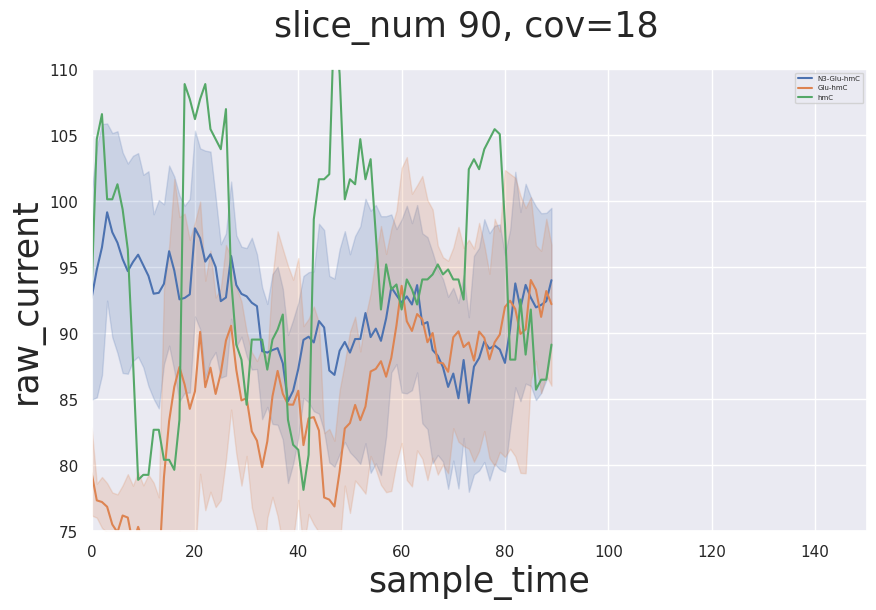

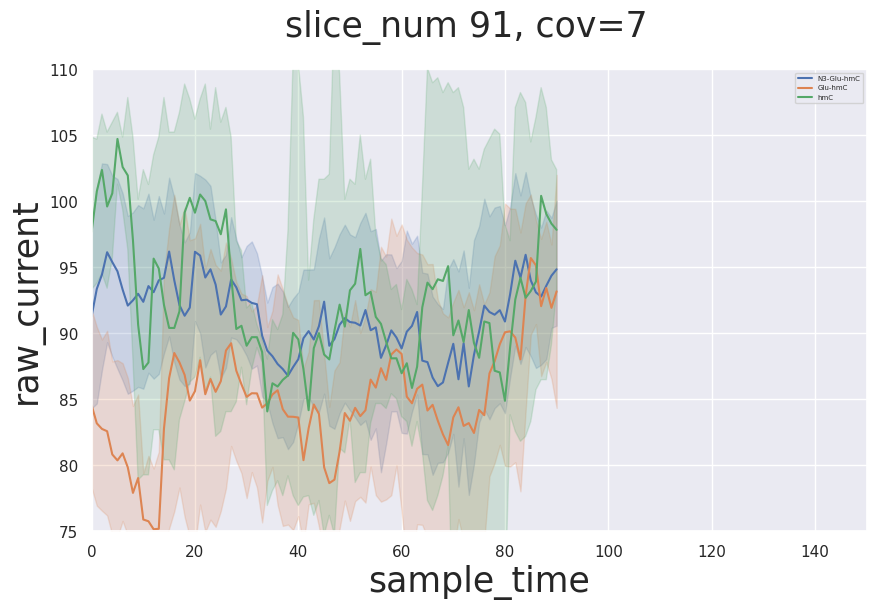

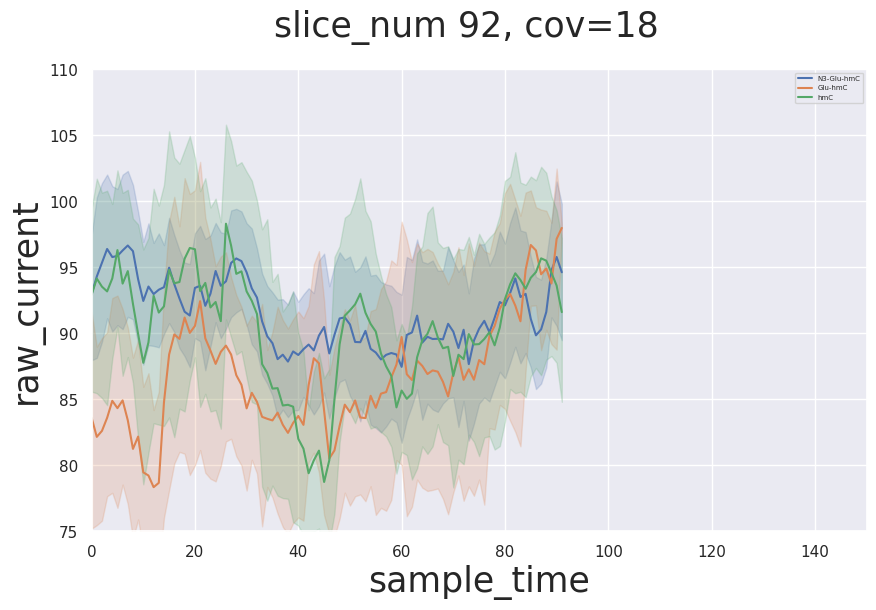

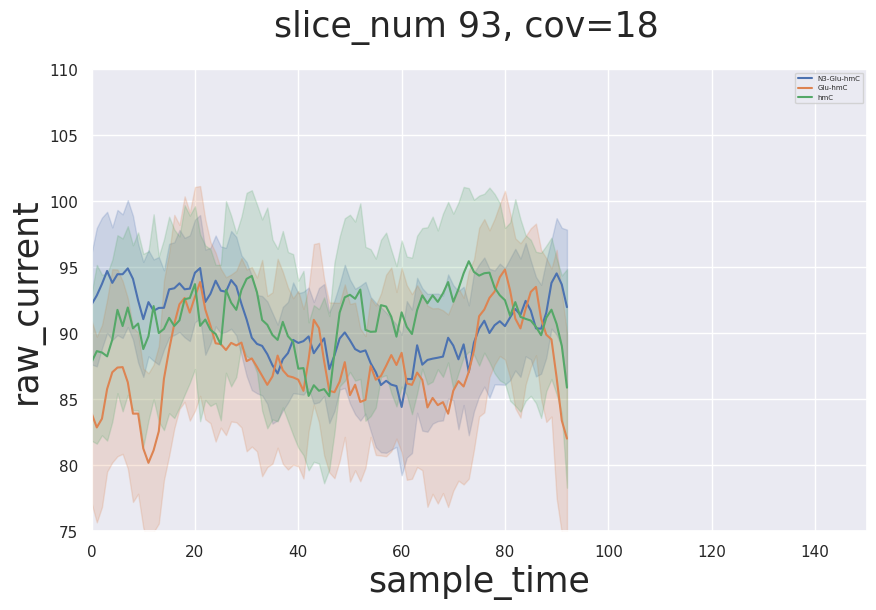

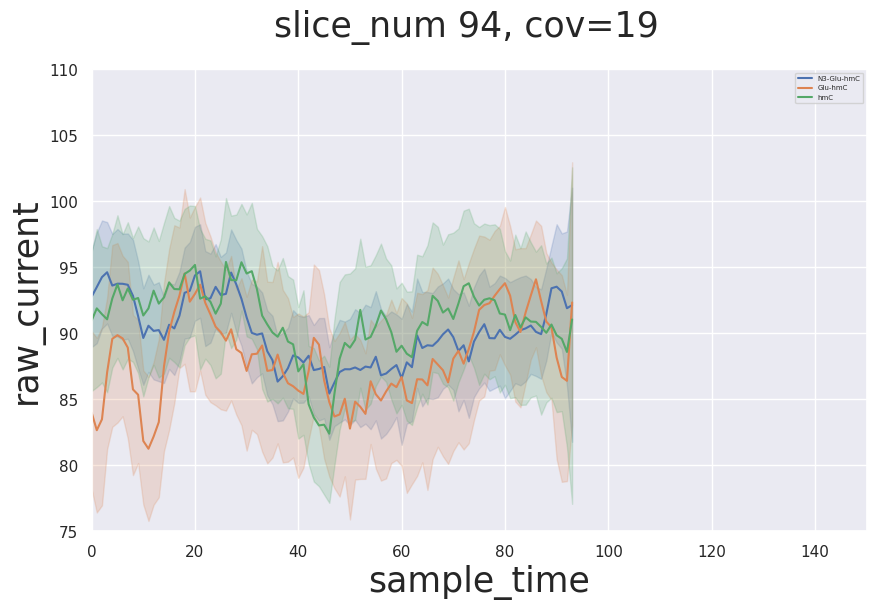

...

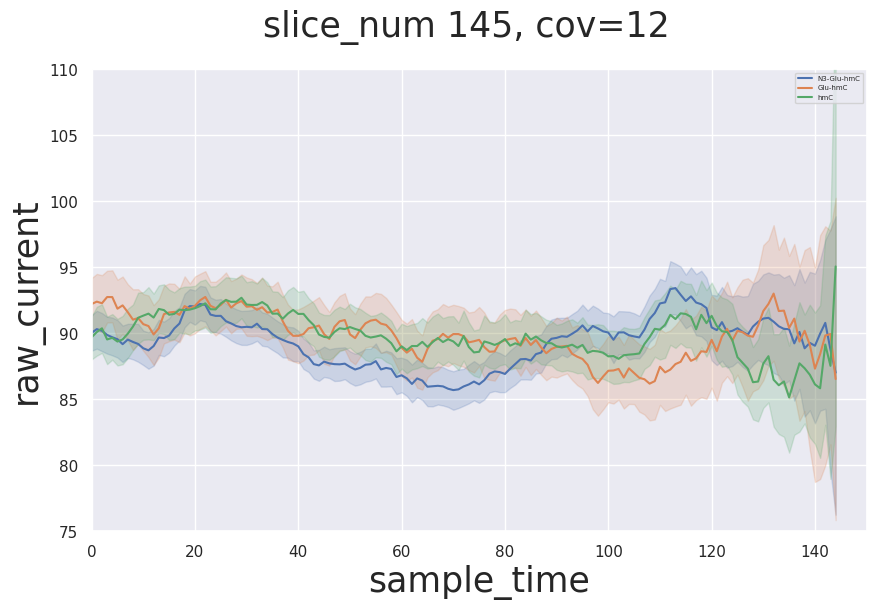

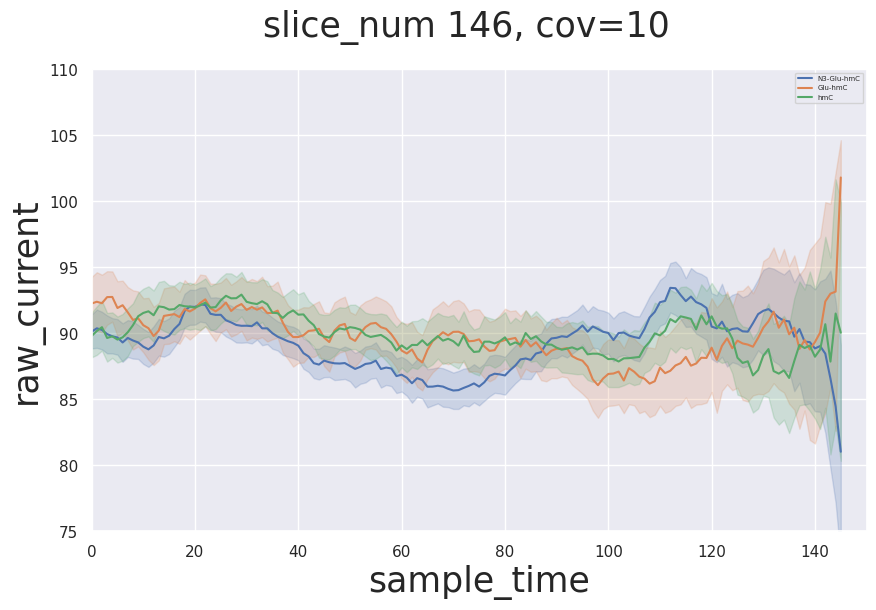

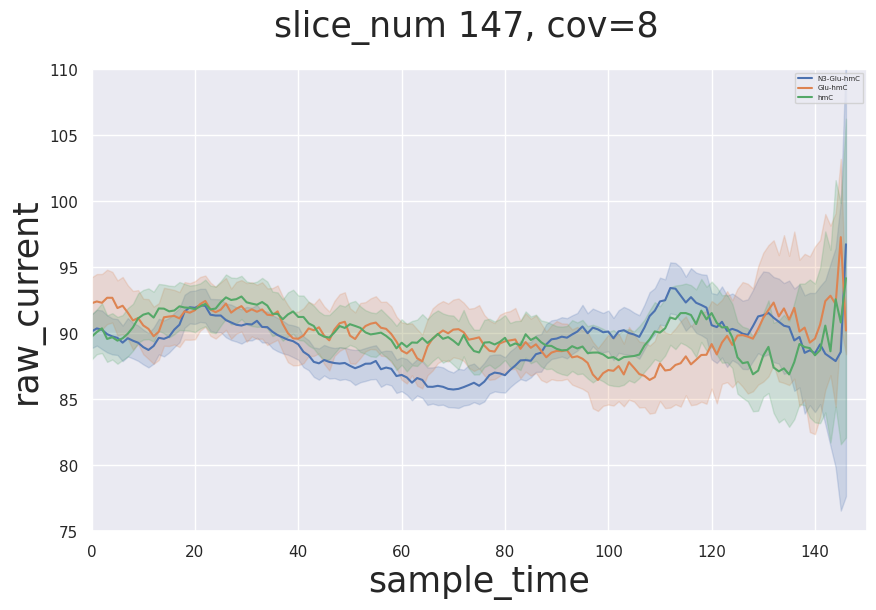

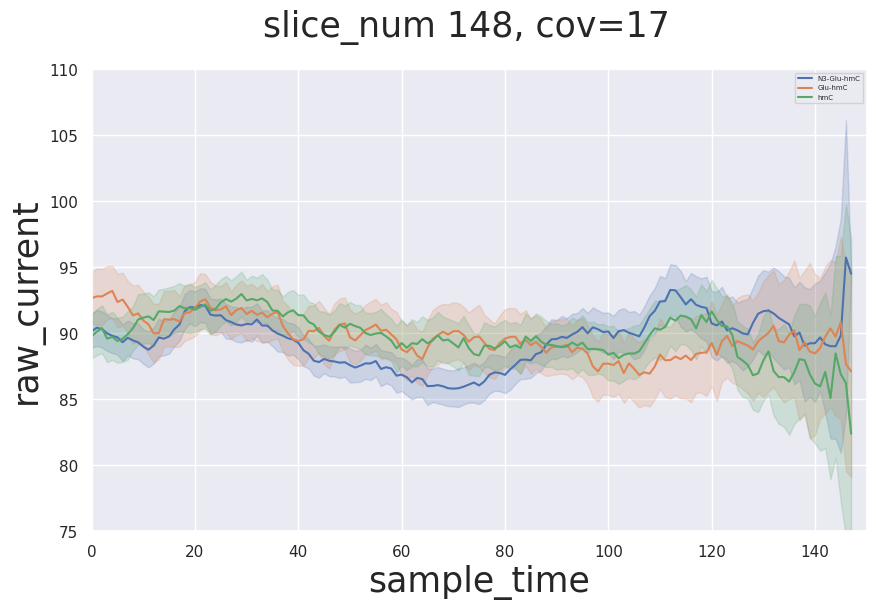

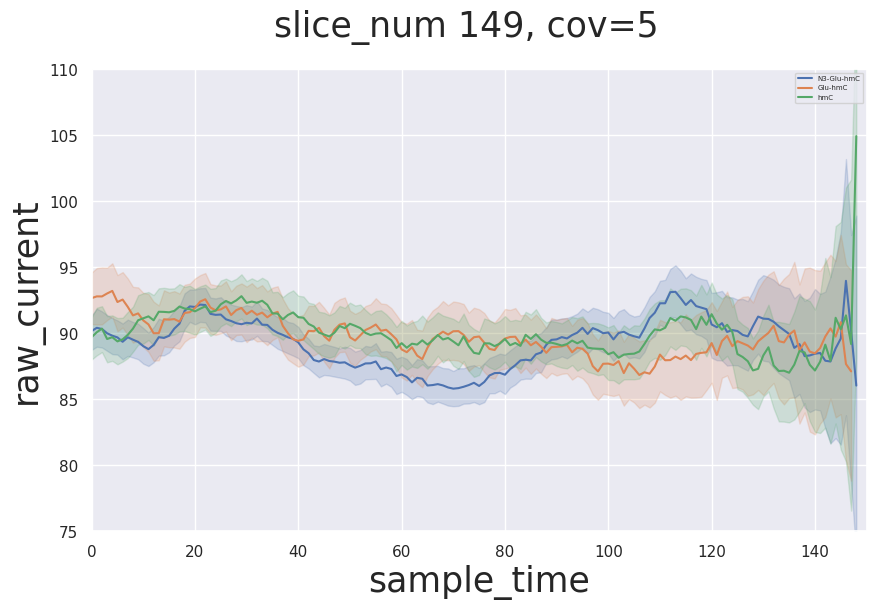

In [26]:
i=0
# slices = [25]#[i for i in range(6,50) if i%5 ==0]
# for slice_num in slices:
fig = plt.figure(figsize=(71.2,50))
# gs = gridspec.GridSpec(5, 5)
columns = ['?', 'Read', 'samples', 'samples_count', 'Modification']
liniar_plot_df = pd.DataFrame(['Read', 'Modification', 'sample_time', 'raw_current'])
#df.columns = ['?', 'Read', 'samples', 'samples_count', 'curr diff', 'd_time diff', 'Modification']
max_slice = 150
slices = [i for i in range(90,max_slice) if i%1 ==0]
for slice_num in slices:
    print(f'{slice_num} slice')
    df_list=[]
#     seq = '1329591_1329619'
#     for bc in ['09','10','11','12']:
#         old_df = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq}_bc_{bc}_eventalign.pkl')
#         temp_df = old_df[(old_df['samples_count']) == slice_num]
#         temp_df = temp_df.drop(columns=['curr diff', 'd_time diff'])
#         df_list.append(temp_df)

    for seq_location in loc_files:

        mod_loc = int(seq_location.split('_')[0])+backwindow

#         df_list=[]
        try:
            for bc in barcodes:# full_dict.keys():
                #if bc != '09':
                temp_df = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')
                temp_df# = temp_df[(temp_df['samples_count']) > 100 & (temp_df['samples_count']<118)]
                temp_df = temp_df[(temp_df['samples_count']) == slice_num]
                df_list.append(temp_df)
        except e:
            print(f"An exception occurred on {seq_location} df_list {e}")
            continue
    
    df = pd.concat(df_list)

        # value_counts = df['samples_count'].value_counts().sort_index()
        # sample_count_max = value_counts.sort_values().idxmax()
        # df = df[df['samples_count'] == sample_count_max]
        # d.update({mod_loc: sample_count_max})

    df.columns = columns
    try:
        #df[for i in list(range(slice_num))] = pd.DataFrame(df.samples.tolist(), index= df.index)
        for index, row in df.iterrows():
            for i in list(range(slice_num)):
                sampls_df_tmp = pd.DataFrame([[index, row['Modification'], i, row['samples'][i]]], columns = ['Read', 'Modification', 'sample_time', 'raw_current'])
                liniar_plot_df = pd.concat([liniar_plot_df, sampls_df_tmp], ignore_index=True)
        fig = plt.figure(figsize=(10,6))
        
        plot = sns.lineplot(data=liniar_plot_df, x='sample_time', y='raw_current', hue='Modification')
        plot.set_xlim(0,max_slice)
        plot.set_ylim(75,110)
        # plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
        # plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
        # plot.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
        # plot.ax_joint.set_ylabel(None)
        # plot.ax_joint.set_xlim(-15,20)
        #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
        # mgkey = SeabornFig2Grid(plot, fig, gs[i])
        i+=1
        #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
        #plot.tick_params(axis='both', which='major', labelsize=8)

#         plt.savefig(f'{run_id_path}/events & NNN plots/agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png')
        print(f'agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png')
        # gs.tight_layout(fig)
        plt.rcParams["axes.labelsize"] = 25
        fig.text(0.5, 0.95, f'slice_num {slice_num}, cov={len(df)}', ha='center', va='center', fontsize=25)
#         fig.text(0.5, 0.02, 'sample_time', ha='center', va='center', fontweight='bold', fontsize=60)
#         fig.text(0.02, 0.5, 'raw_current', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=60)
        plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_#curr_samples_{slice_num}_lineplot_by_kmer.png')
        plot.legend(fontsize=5)
        print(f'{slice_num} done!')
    except e:
        print(f"An exception occurred on {seq_location} df_list {e}")
        continue


In [ ]:

# plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_#curr_samples_lineplot_by_kmer.png')
# # pd.DataFrame(d).plot()
# print(d)
# print([i/back+front+1 for i in d.values()])
# hole_window_agg.keys()

In [4]:
from scipy import stats
from scipy.stats import exponpow
import pandas as pd
import numpy
import math
lable = ["Cytosine", "5hmC", "5gmc", "5gmc-N3"]
print(loc_files)
i=0
hole_window_agg = {}
fig = plt.figure(figsize=(71.2,40))
sits_count = len(loc_files)
a = int(math.sqrt(sits_count))+1
gs = gridspec.GridSpec(a, a)
fig, axs = plt.subplots(a, a, figsize=(30, 20))

quartiles = [5.2,10,90]
hist_arr = []
for seq_location in loc_files:
    mod_loc = int(seq_location.split('_')[0])+backwindow
    hole_window_agg[seq_location] = {}
    
    bins = numpy.linspace(50, 200, 10)
#     hist_arr = []
    k = i%a
    j = i//a
    #print(f'[{j},{k}]')
    for bc in barcodes:
        hole_window_agg[seq_location][bc] = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')

#         a = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index()#.loc[lambda count : count>12]
#         g = a.plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
#         g.set_xlim(0, 240) 
#         g.set_ylim(0, 350) 
#         mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
#         median = hole_window_agg[seq_location][bc]['samples_count'].median()
#         fig = g.figure
#         plt.axvline(mean, color='r', linestyle='--')
#         plt.axvline(median, color='g', linestyle='--')

        #print(hole_window_agg[seq_location][bc]['samples_count'])#.value_counts().sort_index().loc[lambda count : count>12])
        curr_bc_hist = hole_window_agg[seq_location][bc]['samples_count']
        if bc=='02':
            curr_bc_10 = curr_bc_hist
        curr_bc_10 = curr_bc_hist
        hist_arr.append(curr_bc_hist)
        
    percentile = np.percentile(curr_bc_10, quartiles)
    print(quartiles)
    print(percentile)
    for q in percentile:
        axs[j,k].axvline(q, color=full_dict['10']['color'])
    ax2 = axs[j,k].twiny()
    ax2.set_xlim(-10,260)

    # the percentiles as tick positions
    ax2.set_xticks(percentile)
    ax2.set_xticklabels(quartiles, color=full_dict['10']['color'])

    axs[j,k].hist(hist_arr, bins, alpha=0.5, label=lable, histtype='bar', stacked=False)

    axs[j,k].legend(loc='upper right')
    axs[j,k].set_title(f'{seq_location}')  
    axs[j,k].plot
    
#         plt.xticks(rotation = 90)
#         fig.suptitle(bc, fontweight='bold', fontsize=13)
#         plt.show()
#         fig.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')
        
    #mgkey = SeabornFig2Grid(plt, fig, gs[i])


    i+=1
#plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
#plot.tick_params(axis='both', which='major', labelsize=8)
fig.suptitle("kmrs_raw_samples_count_hist")
fig.tight_layout()
fig.savefig(f'{run_id_path}/events & NNN plots/kmrs_raw_samples_count_hist')
gs.tight_layout(fig)

['110037796_110037824', '20467907_20467935', '31229397_31229425', '42454788_42454816', '103777967_103777995', '107098592_107098620', '119988617_119988645', '121485966_121485994', '132490507_132490535', '134110298_134110326', '3649964_3649992', '50073820_50073848', '153073842_153073870', '68038689_68038717', '185755038_185755066', '88165991_88166019', '192541980_192542008', '39939484_39939512', '50730663_50730691', '87327020_87327048', '87327066_87327094', '99979332_99979360', '19397145_19397173', '40938794_40938822', '44786251_44786279', '47244447_47244475', '69721612_69721640', '100044153_100044181', '59200789_59200817', '77838197_77838225', '96828105_96828133', '98255309_98255337', '99676075_99676103', '35229338_35229366', '43098937_43098965', '58430088_58430116', '72511933_72511961', '76354302_76354330', '78457761_78457789', '29045773_29045801', '30878047_30878075', '35546085_35546113', '45885737_45885765', '46269849_46269877', '84162482_84162510', '35274333_35274361', '54892999_548

KeyboardInterrupt: 

<Figure size 7120x4000 with 0 Axes>

Error in callback <function flush_figures at 0x7fc36ee8cd30> (for post_execute):


KeyboardInterrupt: 

In [41]:
[i for i in range(24,101) if i%25 ==0]

[25, 50, 75, 100]

In [48]:
sits_count = len(loc_files)
import math

a = int(math.sqrt(sits_count))+1
a

10